# Compare FAISS Search Methods (Exact vs HNSW vs IVF-PQ vs LSH)

This notebook compares the FAISS search methods benchmarked by
`benchmark_ann.py` on the real ViT COCO embeddings:

```text
1,000 held-out query vectors (seed 42)
        |
122,403 gallery vectors -> Exact FlatIP / HNSW / IVF-PQ / LSH
        |
exact top-20 = ground truth -> Recall@5/10/20 per method
```

It shows:

1. an aggregate metrics table (recall, latency, QPS, build time, index size),
2. recall-vs-latency and recall-vs-size plots plus parameter sweeps,
3. **the same query searched by every method side by side**, with per-result
   hit/miss markers against the exact top-K.

Prerequisite: run `benchmark_ann.py` once (see README.md step 6), and have
the ViT embeddings and COCO images in place (steps 2 and 1).

In [10]:
import json
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

# Query image ids to visualise in section 2. None = first 3 of the
# 1,000 benchmark queries. Any id printed as "available query ids"
# below can be used.
QUERY_IDS = None

# Which ANN settings to display side by side (file stems from
# results/ann/per_query/, without "_top20.npy"). The full list of
# available settings is printed below - swap freely.
SHOW_SETTINGS = {
    "hnsw_ef128": "HNSW (efSearch=128)",
    "ivfpq_np32": "IVF-PQ (nprobe=32)",
    "lsh_nb512": "LSH (nbits=512)",
}

K_DISPLAY = 10   # results shown per method (recall computed at this K)
SAVE_IMAGES = True

In [11]:
# Resolve the repo root whether the notebook runs from its own folder
# or from the repository root.
REPO_ROOT = Path.cwd()
if not (REPO_ROOT / "data" / "circo").exists():
    REPO_ROOT = REPO_ROOT.parent.parent

EMBEDDINGS_PATH = REPO_ROOT / "data" / "circo" / "vit_embeddings.npy"
IDS_PATH = REPO_ROOT / "data" / "circo" / "vit_image_ids.npy"
IMAGE_DIR = REPO_ROOT / "data" / "circo" / "unlabeled2017"
ANN_DIR = REPO_ROOT / "experiments" / "vit-coco-faiss" / "results" / "ann"
PER_QUERY_DIR = ANN_DIR / "per_query"
OUTPUT_DIR = ANN_DIR / "visual-comparisons"

data = json.loads((ANN_DIR / "ann_results.json").read_text())
embeddings = np.load(EMBEDDINGS_PATH, mmap_mode="r")
ids = np.load(IDS_PATH)
query_rows = np.load(PER_QUERY_DIR / "query_rows.npy")
gallery_rows = np.load(PER_QUERY_DIR / "gallery_rows.npy")
exact_top20 = np.load(PER_QUERY_DIR / "exact_top20.npy")
query_ids = ids[query_rows]

def to_coco_filename(image_id):
    # COCO filenames are 12-digit zero-padded ids.
    return IMAGE_DIR / f"{int(image_id):012d}.jpg"

def to_image_id(gallery_row):
    # gallery row -> original embedding row -> COCO image id
    return int(ids[gallery_rows[int(gallery_row)]])

metadata = data["metadata"]
print("gallery size:", metadata["gallery_size"])
print("queries:", metadata["num_queries"], "| dimension:", metadata["dimension"])
print("ground truth K:", metadata["k_gt"], "| seed:", metadata["seed"])
print()
print("available query image ids (first 30 of", len(query_ids), "):")
print(query_ids[:30].tolist())
print()
print("available ANN settings in per_query/:")
for path in sorted(PER_QUERY_DIR.glob("*_top20.npy")):
    print("  -", path.name.replace("_top20.npy", ""))

gallery size: 122403
queries: 1000 | dimension: 768
ground truth K: 20 | seed: 42

available query image ids (first 30 of 1000 ):
[159, 957, 1944, 1973, 2336, 2396, 2980, 3683, 5645, 7215, 7748, 8256, 8713, 8865, 10845, 10853, 11098, 11103, 11174, 11353, 13581, 14147, 14183, 14571, 14670, 16754, 16996, 17102, 18738, 19254]

available ANN settings in per_query/:
  - exact
  - hnsw_ef128
  - hnsw_ef16
  - hnsw_ef256
  - hnsw_ef32
  - hnsw_ef64
  - ivfpq_np16
  - ivfpq_np1
  - ivfpq_np32
  - ivfpq_np4
  - ivfpq_np64
  - ivfpq_np8
  - lsh_nb256
  - lsh_nb512


## 1. Aggregate comparison

Recall@K = fraction of the exact top-K neighbours that the method also
returns. All searches ran single-threaded; build times used all cores.

In [12]:
def setting_str(row):
    params = row["parameters"]
    algo = row["algorithm"]
    if algo == "HNSW":
        return f"efSearch={params['efSearch']}"
    if algo == "IVF-PQ":
        return f"nprobe={params['nprobe']}"
    if algo == "LSH":
        return f"nbits={params['nbits']}"
    return "-"

rows = data["results"]
header = (
    f"{'Method':<13} {'Setting':<14} {'R@5':>6} {'R@10':>6} {'R@20':>6} "
    f"{'ms/query':>9} {'QPS':>8} {'build(s)':>9} {'size(MB)':>9}"
)
print(header)
print("-" * len(header))
for row in rows:
    print(
        f"{row['algorithm']:<13} {setting_str(row):<14} "
        f"{row['recall_at_5']:>6.3f} {row['recall_at_10']:>6.3f} {row['recall_at_20']:>6.3f} "
        f"{row['latency_ms_per_query']:>9.3f} {row['queries_per_second']:>8.1f} "
        f"{row['build_seconds']:>9.1f} {row['index_size_mb']:>9.1f}"
    )

Method        Setting           R@5   R@10   R@20  ms/query      QPS  build(s)  size(MB)
----------------------------------------------------------------------------------------
Exact FlatIP  -               1.000  1.000  1.000     2.158    463.5       4.0     358.6
HNSW          efSearch=16     0.932  0.915  0.892     0.149   6699.5      36.9     390.4
HNSW          efSearch=32     0.970  0.963  0.954     0.236   4240.3      36.9     390.4
HNSW          efSearch=64     0.989  0.986  0.984     0.379   2635.1      36.9     390.4
HNSW          efSearch=128    0.996  0.995  0.995     0.704   1421.1      36.9     390.4
HNSW          efSearch=256    0.998  0.997  0.998     1.087    919.7      36.9     390.4
IVF-PQ        nprobe=1        0.365  0.403  0.432     0.105   9486.0      25.4       8.0
IVF-PQ        nprobe=4        0.414  0.460  0.500     0.189   5304.4      25.4       8.0
IVF-PQ        nprobe=8        0.418  0.464  0.505     0.202   4956.5      25.4       8.0
IVF-PQ        nprobe=

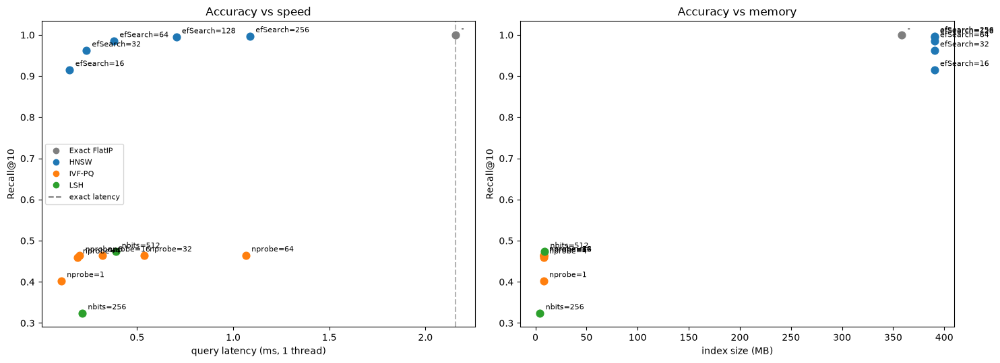

In [13]:
# Left: recall@10 vs latency (speed-accuracy trade-off).
# Right: recall@10 vs index size (memory-accuracy trade-off).
colors = {
    "Exact FlatIP": "tab:gray",
    "HNSW": "tab:blue",
    "IVF-PQ": "tab:orange",
    "LSH": "tab:green",
}
exact_row = next(r for r in rows if r["algorithm"] == "Exact FlatIP")

fig, axes = plt.subplots(1, 2, figsize=(15, 5.5))
for row in rows:
    color = colors[row["algorithm"]]
    axes[0].scatter(row["latency_ms_per_query"], row["recall_at_10"], color=color, s=60)
    axes[0].annotate(
        setting_str(row),
        (row["latency_ms_per_query"], row["recall_at_10"]),
        textcoords="offset points", xytext=(6, 4), fontsize=8,
    )
    axes[1].scatter(row["index_size_mb"], row["recall_at_10"], color=color, s=60)
    axes[1].annotate(
        setting_str(row),
        (row["index_size_mb"], row["recall_at_10"]),
        textcoords="offset points", xytext=(6, 4), fontsize=8,
    )

axes[0].axvline(exact_row["latency_ms_per_query"], color="tab:gray",
                linestyle="--", alpha=0.6, label="exact latency")
axes[0].set_xlabel("query latency (ms, 1 thread)")
axes[0].set_ylabel("Recall@10")
axes[0].set_title("Accuracy vs speed")
axes[0].legend(handles=[plt.Line2D([], [], marker="o", linestyle="", color=c, label=a)
                        for a, c in colors.items()] + [plt.Line2D([], [], color="tab:gray", linestyle="--", label="exact latency")],
                fontsize=8)
axes[1].set_xlabel("index size (MB)")
axes[1].set_ylabel("Recall@10")
axes[1].set_title("Accuracy vs memory")
plt.tight_layout()
plt.show()

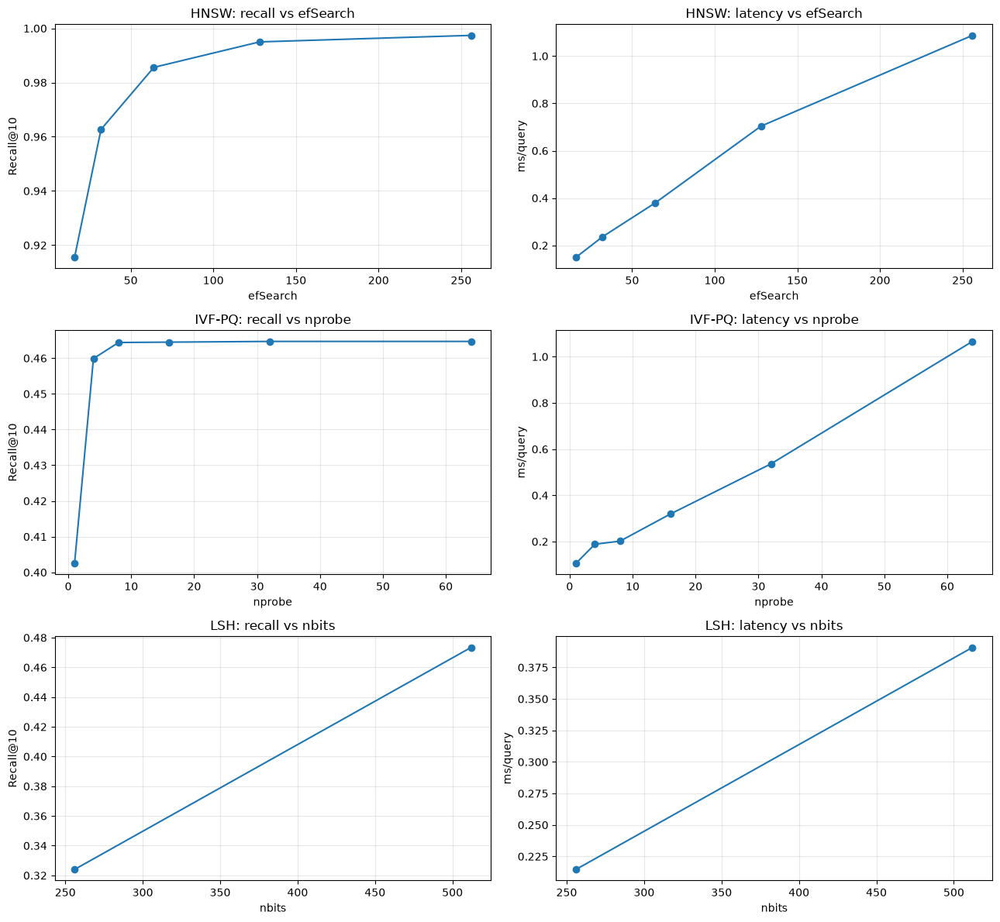

In [14]:
# Parameter sweeps: recall@10 and latency vs the swept parameter.
sweep_specs = [
    ("HNSW", "efSearch"),
    ("IVF-PQ", "nprobe"),
    ("LSH", "nbits"),
]
fig, axes = plt.subplots(len(sweep_specs), 2, figsize=(13, 4 * len(sweep_specs)))
for i, (algo, param) in enumerate(sweep_specs):
    sub = [r for r in rows if r["algorithm"] == algo]
    x = [r["parameters"][param] for r in sub]
    axes[i][0].plot(x, [r["recall_at_10"] for r in sub], "o-")
    axes[i][0].set_xlabel(param)
    axes[i][0].set_ylabel("Recall@10")
    axes[i][0].set_title(f"{algo}: recall vs {param}")
    axes[i][0].grid(alpha=0.3)
    axes[i][1].plot(x, [r["latency_ms_per_query"] for r in sub], "o-")
    axes[i][1].set_xlabel(param)
    axes[i][1].set_ylabel("ms/query")
    axes[i][1].set_title(f"{algo}: latency vs {param}")
    axes[i][1].grid(alpha=0.3)
plt.tight_layout()
plt.show()

## 2. Same query, different methods

One row per method, all searching the **same query** (first column).
Each result is labelled `#rank OK/MISS id cosine`. **MISS** (red) means
the exact top-10 also contains that neighbour but this method ranked
something else there instead - i.e. a retrieval error. The row label
shows the method's per-query Recall@10.

In [15]:
def top_k(setting_key, k):
    arr = np.load(PER_QUERY_DIR / f"{setting_key}_top20.npy")
    return arr[:, :k]

def query_position(query_id):
    matches = np.where(query_ids == int(query_id))[0]
    return int(matches[0]) if len(matches) else None

def exact_id_set(position, k):
    return {to_image_id(row) for row in exact_top20[position, :k]}

def per_query_recall(setting_key, position, k):
    found = {to_image_id(row) for row in top_k(setting_key, k)[position] if row >= 0}
    return len(found & exact_id_set(position, k)) / k

if QUERY_IDS is None:
    QUERY_IDS = query_ids[:3].tolist()

saved: experiments/vit-coco-faiss/results/ann/visual-comparisons/query_159_methods.png


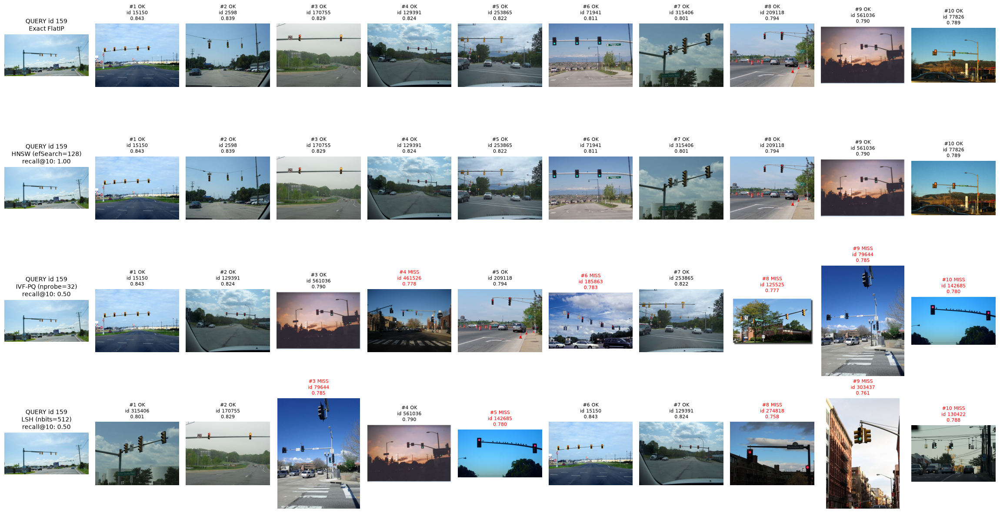

saved: experiments/vit-coco-faiss/results/ann/visual-comparisons/query_957_methods.png


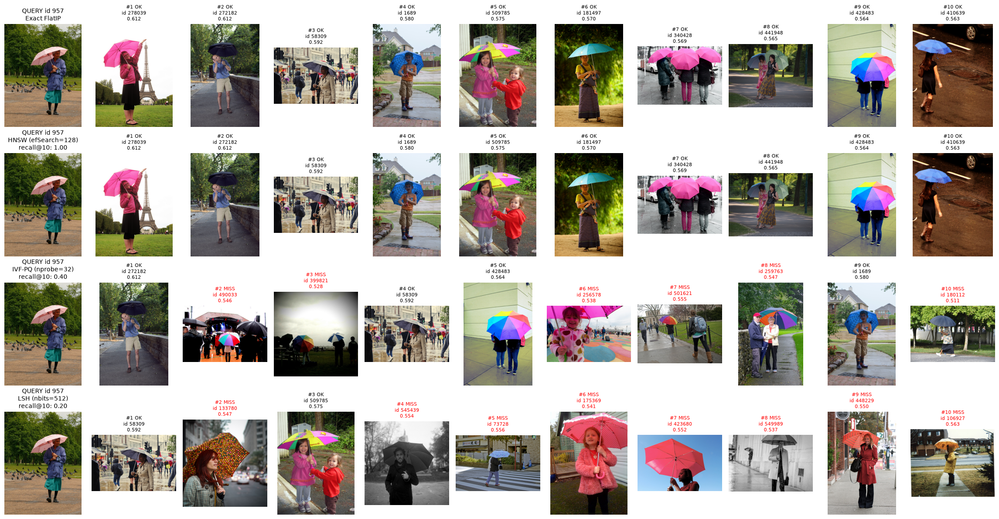

saved: experiments/vit-coco-faiss/results/ann/visual-comparisons/query_1944_methods.png


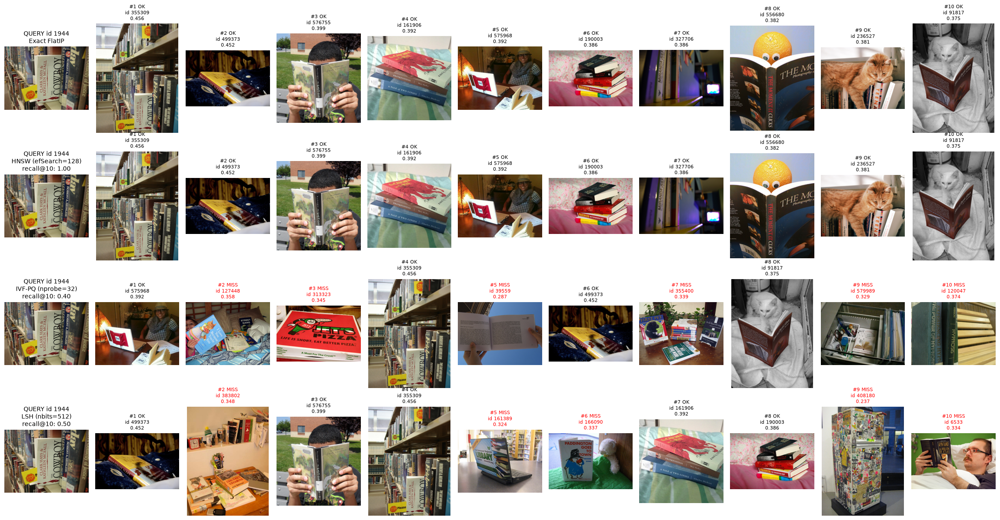

In [16]:
def compare_query(query_id):
    position = query_position(query_id)
    if position is None:
        print(f"query {query_id} is not in the benchmark query set - pick an id from the list above")
        return

    query_row = int(query_rows[position])
    query_vector = np.asarray(embeddings[query_row])
    query_image = Image.open(to_coco_filename(query_id)).convert("RGB")
    reference = exact_id_set(position, K_DISPLAY)

    method_list = [("exact", "Exact FlatIP")] + list(SHOW_SETTINGS.items())
    fig, axes = plt.subplots(
        len(method_list), K_DISPLAY + 1,
        figsize=(2.1 * (K_DISPLAY + 1), 3.0 * len(method_list)),
    )

    for r, (key, label) in enumerate(method_list):
        # First column: the shared query image, labelled with the method.
        if key == "exact":
            title = f"QUERY id {query_id}\n{label}"
        else:
            recall = per_query_recall(key, position, K_DISPLAY)
            title = f"QUERY id {query_id}\n{label}\nrecall@{K_DISPLAY}: {recall:.2f}"
        axes[r][0].imshow(query_image)
        axes[r][0].set_title(title, fontsize=10)
        axes[r][0].axis("off")

        result_rows = (
            exact_top20[position, :K_DISPLAY] if key == "exact"
            else top_k(key, K_DISPLAY)[position]
        )

        for c, gallery_row in enumerate(result_rows, start=1):
            ax = axes[r][c]
            if gallery_row < 0:
                # FAISS pads with -1 when fewer than K results exist.
                ax.set_facecolor("lightgray")
                ax.set_title("not\nreturned", fontsize=8)
                ax.set_xticks([]); ax.set_yticks([])
                continue
            result_id = to_image_id(gallery_row)
            result_vector = np.asarray(embeddings[int(gallery_rows[gallery_row])])
            score = float(result_vector @ query_vector)  # cosine (normalized)
            hit = result_id in reference
            ax.imshow(Image.open(to_coco_filename(result_id)).convert("RGB"))
            ax.set_title(
                f"#{c} {'OK' if hit else 'MISS'}\nid {result_id}\n{score:.3f}",
                fontsize=8, color="black" if hit else "red",
            )
            ax.axis("off")

    plt.tight_layout()
    if SAVE_IMAGES:
        OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
        out_path = OUTPUT_DIR / f"query_{query_id}_methods.png"
        plt.savefig(out_path, dpi=120, bbox_inches="tight")
        print("saved:", out_path.relative_to(REPO_ROOT))
    plt.show()

for query_id in QUERY_IDS:
    compare_query(query_id)

### Per-query recall across every setting

Recall@10 of each benchmarked setting for the queries visualised above.

In [17]:
all_settings = [
    p.name.replace("_top20.npy", "")
    for p in sorted(PER_QUERY_DIR.glob("*_top20.npy"))
    if p.name != "exact_top20.npy"
]

columns = ["exact"] + all_settings
print(f"{'query id':<10}" + "".join(f"{c:>12}" for c in columns))
for query_id in QUERY_IDS:
    position = query_position(query_id)
    if position is None:
        continue
    values = [1.0]  # exact is the reference: recall = 1 by definition
    for key in all_settings:
        values.append(per_query_recall(key, position, K_DISPLAY))
    print(f"{query_id:<10}" + "".join(f"{v:>12.2f}" for v in values))

query id         exact  hnsw_ef128   hnsw_ef16  hnsw_ef256   hnsw_ef32   hnsw_ef64  ivfpq_np16   ivfpq_np1  ivfpq_np32   ivfpq_np4  ivfpq_np64   ivfpq_np8   lsh_nb256   lsh_nb512
159               1.00        1.00        1.00        1.00        1.00        1.00        0.50        0.50        0.50        0.50        0.50        0.50        0.30        0.50
957               1.00        1.00        0.90        1.00        1.00        1.00        0.40        0.40        0.40        0.40        0.40        0.40        0.40        0.20
1944              1.00        1.00        0.90        1.00        0.90        1.00        0.40        0.40        0.40        0.40        0.40        0.40        0.10        0.50


## 3. Sanity checks

In [18]:
num_queries = metadata["num_queries"]
k_gt = metadata["k_gt"]
gallery_size = metadata["gallery_size"]

for path in sorted(PER_QUERY_DIR.glob("*_top20.npy")):
    arr = np.load(path)
    assert arr.shape == (num_queries, k_gt), f"bad shape in {path.name}: {arr.shape}"
    assert arr.min() >= -1 and arr.max() < gallery_size, f"out-of-range rows in {path.name}"

exact_metrics = next(r for r in rows if r["algorithm"] == "Exact FlatIP")
assert abs(exact_metrics["recall_at_10"] - 1.0) < 1e-9, "exact recall@10 must be 1.0"

# Held-out split: a query image must never appear in its own results.
for position in range(num_queries):
    query_id = int(query_ids[position])
    result_ids = {to_image_id(row) for row in exact_top20[position] if row >= 0}
    assert query_id not in result_ids, f"query {query_id} leaked into gallery"

print("ALL CHECKS PASSED")
print("- every per-query file has shape", (num_queries, k_gt))
print("- exact baseline recall@10 = 1.0")
print("- no query image appears in its own results (held-out split verified)")

ALL CHECKS PASSED
- every per-query file has shape (1000, 20)
- exact baseline recall@10 = 1.0
- no query image appears in its own results (held-out split verified)


## How to adjust

- **Other queries**: set `QUERY_IDS` in the config cell to any id from the
  "available query image ids" list, then re-run the cells.
- **Other settings side by side**: replace keys in `SHOW_SETTINGS` with any
  setting listed under "available ANN settings" (e.g. `"hnsw_ef256"`),
  then re-run section 2.
- **More displayed results**: raise `K_DISPLAY` (up to 20, the saved
  ground-truth depth).
- The notebook only reads the benchmark outputs; re-running it never
  recomputes FAISS or ViT.